In [40]:
import os 
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
os.environ["SM_FRAMEWORK"] = "tf.keras"
import warnings
warnings.filterwarnings("ignore")

In [4]:
import shutil
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tqdm import tqdm
import warnings
warnings.filterwarnings("ignore")

from skimage.io import imread
from skimage.transform import resize

from sklearn.model_selection import train_test_split

import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, Conv2DTranspose, MaxPooling2D, BatchNormalization, Activation, concatenate
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping , ReduceLROnPlateau
import warnings



In [5]:
input_dir = "/kaggle/input/lgg-mri-segmentation/kaggle_3m"
output_images = "/kaggle/working/images"
output_masks = "/kaggle/working/masks"

os.makedirs(output_images, exist_ok=True)
os.makedirs(output_masks, exist_ok=True)

for case_folder in os.listdir(input_dir):
    case_path = os.path.join(input_dir, case_folder)
    if not os.path.isdir(case_path):
        continue

    for file in os.listdir(case_path):
        if file.endswith('.tif'):
            full_path = os.path.join(case_path, file)
            if '_mask' in file.lower():
                shutil.copy(full_path, os.path.join(output_masks, case_folder + '_' + file))
            else:
                shutil.copy(full_path, os.path.join(output_images, case_folder + '_' + file))


In [6]:
image_paths = sorted([os.path.join(output_images ,f) for f in os.listdir(output_images)]) 
mask_paths = sorted ([os.path.join(output_masks , f ) for f in os.listdir(output_masks)])

data = []
for img , msk in zip(image_paths ,mask_paths ):
    data.append({
        "image_path" : img,
        "mask_path" : msk,
        "image_name" : os.path.basename(img),
        "mask_name" : os.path.basename(msk)
    }
    )
df = pd.DataFrame(data)
df.head()

,image_path,mask_path,image_name,mask_name
0,/kaggle/working/images/TCGA_CS_4941_19960909_T...,/kaggle/working/masks/TCGA_CS_4941_19960909_TC...,TCGA_CS_4941_19960909_TCGA_CS_4941_19960909_1.tif,TCGA_CS_4941_19960909_TCGA_CS_4941_19960909_10...
1,/kaggle/working/images/TCGA_CS_4941_19960909_T...,/kaggle/working/masks/TCGA_CS_4941_19960909_TC...,TCGA_CS_4941_19960909_TCGA_CS_4941_19960909_10...,TCGA_CS_4941_19960909_TCGA_CS_4941_19960909_11...
2,/kaggle/working/images/TCGA_CS_4941_19960909_T...,/kaggle/working/masks/TCGA_CS_4941_19960909_TC...,TCGA_CS_4941_19960909_TCGA_CS_4941_19960909_11...,TCGA_CS_4941_19960909_TCGA_CS_4941_19960909_12...
3,/kaggle/working/images/TCGA_CS_4941_19960909_T...,/kaggle/working/masks/TCGA_CS_4941_19960909_TC...,TCGA_CS_4941_19960909_TCGA_CS_4941_19960909_12...,TCGA_CS_4941_19960909_TCGA_CS_4941_19960909_13...
4,/kaggle/working/images/TCGA_CS_4941_19960909_T...,/kaggle/working/masks/TCGA_CS_4941_19960909_TC...,TCGA_CS_4941_19960909_TCGA_CS_4941_19960909_13...,TCGA_CS_4941_19960909_TCGA_CS_4941_19960909_14...


In [33]:
IMG_HEIGHT = 256
IMG_WIDTH = 256

def preprocess_image(image_path):
    if isinstance(image_path, bytes):
        image_path = image_path.decode("utf-8")
    image = imread(image_path)
    image = resize(image, (IMG_HEIGHT, IMG_WIDTH), mode='constant', preserve_range=True)
    if len(image.shape) == 2:
        image = np.stack((image,) * 3, axis=-1)
    elif image.shape[-1] == 4:
        image = image[..., :3]
    return image / 255.0

def preprocess_mask(mask_path):
    if isinstance(mask_path, bytes):
        mask_path = mask_path.decode("utf-8")
    mask = imread(mask_path, as_gray=True)
    mask = resize(mask, (IMG_HEIGHT, IMG_WIDTH), mode='constant', preserve_range=True)
    mask = np.expand_dims(mask, axis=-1)
    return (mask > 0.5).astype(np.float32)


def load_image_and_mask(image_path, mask_path):
    if isinstance(image_path, tf.Tensor):
        image_path = image_path.numpy().decode('utf-8')
    if isinstance(mask_path, tf.Tensor):
        mask_path = mask_path.numpy().decode('utf-8')
    
    image = preprocess_image(image_path)
    mask = preprocess_mask(mask_path)
    return image.astype(np.float32), mask.astype(np.float32)


def create_dataset(image_paths, mask_paths, batch_size=16, shuffle=True):
    dataset = tf.data.Dataset.from_tensor_slices((image_paths, mask_paths))
    if shuffle:
        dataset = dataset.shuffle(buffer_size=100)
    
    dataset = dataset.map(
        lambda img, mask: tf.py_function(
            func=load_image_and_mask,
            inp=[img, mask],
            Tout=[tf.float32, tf.float32]
        ),
        num_parallel_calls=tf.data.AUTOTUNE
    )
    
    dataset = dataset.map(
        lambda img, mask: (
            tf.ensure_shape(img, [IMG_HEIGHT, IMG_WIDTH, 3]),
            tf.ensure_shape(mask, [IMG_HEIGHT, IMG_WIDTH, 1])
        ),
        num_parallel_calls=tf.data.AUTOTUNE
    )
    
    dataset = dataset.batch(batch_size)
    dataset = dataset.prefetch(tf.data.AUTOTUNE)
    return dataset


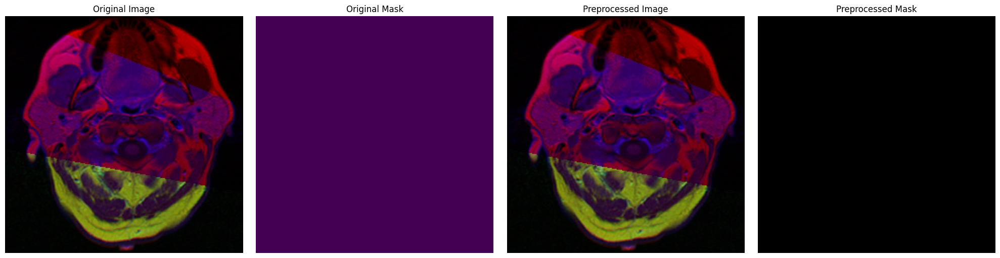

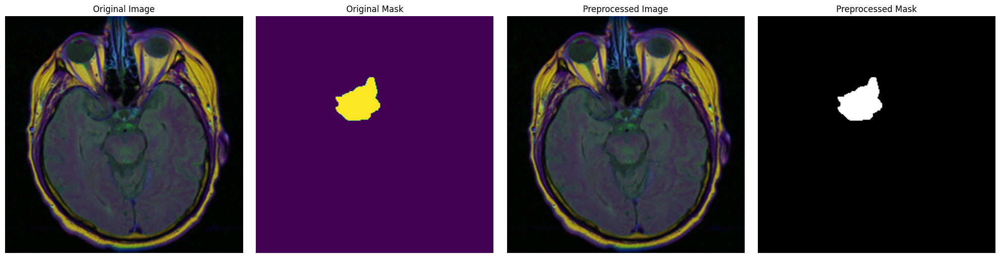

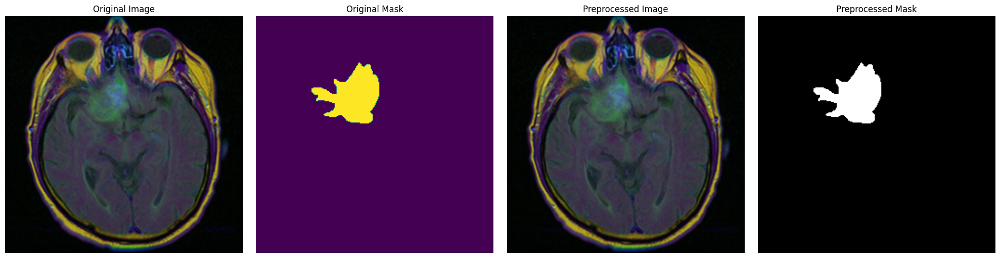

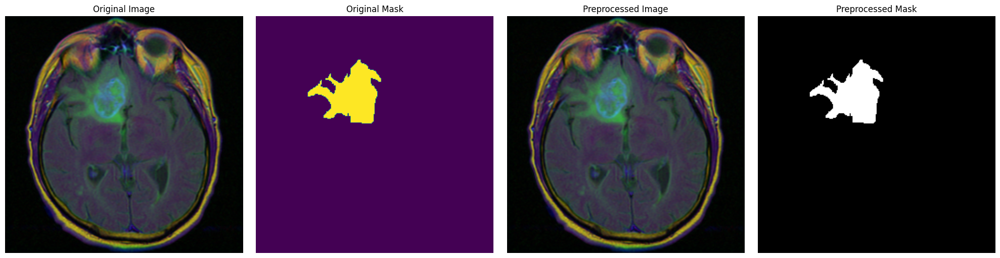

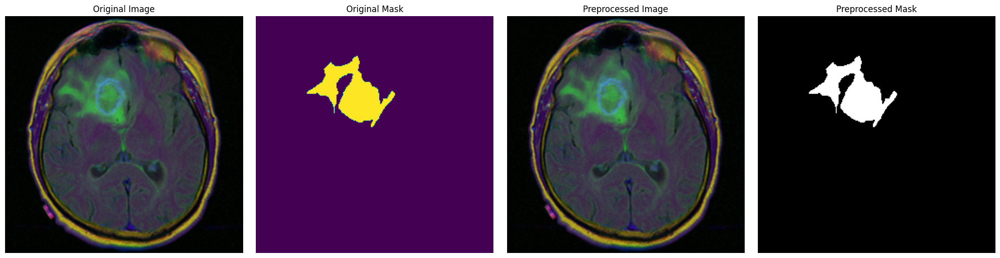

In [34]:
def show_preprocessing_sample(index):
    original_image = imread(df.loc[index , "image_path"])
    original_mask = imread(df.loc[index , "mask_path"])
    processed_image = preprocess_image(df.loc[index , "image_path"])
    processed_mask = preprocess_mask(df.loc[index , "mask_path"])

    fig , axs = plt.subplots(1 , 4 , figsize=(20 , 5))
    axs[0].imshow(original_image)
    axs[0].set_title("Original Image")
    
    axs[1].imshow(original_mask)
    axs[1].set_title("Original Mask")
    
    axs[2].imshow(processed_image)
    axs[2].set_title("Preprocessed Image")
    
    axs[3].imshow(processed_mask.squeeze() , cmap='gray' )
    axs[3].set_title("Preprocessed Mask")

    for ax in axs:
        ax.axis("off")

    plt.tight_layout()
    plt.show()


for i in range (5):
    show_preprocessing_sample(i)

In [35]:
image_paths = df["image_path"].values
mask_paths  = df["mask_path"].values

In [36]:
x_temp, x_test, y_temp, y_test = train_test_split(image_paths, mask_paths, test_size=0.15, random_state=42)
x_train, x_val, y_train, y_val = train_test_split(x_temp, y_temp, test_size=0.1765, random_state=42)

In [37]:
train_dataset = create_dataset(x_train, y_train, batch_size=8)
val_dataset   = create_dataset(x_val, y_val, batch_size=8, shuffle=False)
test_dataset  = create_dataset(x_test, y_test, batch_size=8, shuffle=False)

In [38]:
def unet(input_size=(256, 256, 3)):
    inputs = Input(input_size)

    # First DownConvolution / Encoder Leg will begin, so start with Conv2D
    conv1 = Conv2D(filters=64, kernel_size=(3, 3), padding="same")(inputs)
    bn1 = Activation("relu")(conv1)
    conv1 = Conv2D(filters=64, kernel_size=(3, 3), padding="same")(bn1)
    bn1 = BatchNormalization(axis=3)(conv1)
    bn1 = Activation("relu")(bn1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(bn1)

    conv2 = Conv2D(filters=128, kernel_size=(3, 3), padding="same")(pool1)
    bn2 = Activation("relu")(conv2)
    conv2 = Conv2D(filters=128, kernel_size=(3, 3), padding="same")(bn2)
    bn2 = BatchNormalization(axis=3)(conv2)
    bn2 = Activation("relu")(bn2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(bn2)

    conv3 = Conv2D(filters=256, kernel_size=(3, 3), padding="same")(pool2)
    bn3 = Activation("relu")(conv3)
    conv3 = Conv2D(filters=256, kernel_size=(3, 3), padding="same")(bn3)
    bn3 = BatchNormalization(axis=3)(conv3)
    bn3 = Activation("relu")(bn3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(bn3)

    conv4 = Conv2D(filters=512, kernel_size=(3, 3), padding="same")(pool3)
    bn4 = Activation("relu")(conv4)
    conv4 = Conv2D(filters=512, kernel_size=(3, 3), padding="same")(bn4)
    bn4 = BatchNormalization(axis=3)(conv4)
    bn4 = Activation("relu")(bn4)
    pool4 = MaxPooling2D(pool_size=(2, 2))(bn4)

    conv5 = Conv2D(filters=1024, kernel_size=(3, 3), padding="same")(pool4)
    bn5 = Activation("relu")(conv5)
    conv5 = Conv2D(filters=1024, kernel_size=(3, 3), padding="same")(bn5)
    bn5 = BatchNormalization(axis=3)(conv5)
    bn5 = Activation("relu")(bn5)

    """ Now UpConvolution / Decoder Leg will begin, so start with Conv2DTranspose
    The gray arrows (in the above image) indicate the skip connections that concatenate the encoder feature map with the decoder, which helps the backward flow of gradients for improved training. """
    """ After every concatenation we again apply two consecutive regular convolutions so that the model can learn to assemble a more precise output """

    up6 = concatenate([Conv2DTranspose(512, kernel_size=(2, 2), strides=(2, 2), padding="same")(bn5), conv4], axis=3)
    conv6 = Conv2D(filters=512, kernel_size=(3, 3), padding="same")(up6)
    bn6 = Activation("relu")(conv6)
    conv6 = Conv2D(filters=512, kernel_size=(3, 3), padding="same")(bn6)
    bn6 = BatchNormalization(axis=3)(conv6)
    bn6 = Activation("relu")(bn6)

    up7 = concatenate([Conv2DTranspose(256, kernel_size=(2, 2), strides=(2, 2), padding="same")(bn6), conv3], axis=3)
    conv7 = Conv2D(filters=256, kernel_size=(3, 3), padding="same")(up7)
    bn7 = Activation("relu")(conv7)
    conv7 = Conv2D(filters=256, kernel_size=(3, 3), padding="same")(bn7)
    bn7 = BatchNormalization(axis=3)(conv7)
    bn7 = Activation("relu")(bn7)

    up8 = concatenate([Conv2DTranspose(128, kernel_size=(2, 2), strides=(2, 2), padding="same")(bn7), conv2], axis=3)
    conv8 = Conv2D(filters=128, kernel_size=(3, 3), padding="same")(up8)
    bn8 = Activation("relu")(conv8)
    conv8 = Conv2D(filters=128, kernel_size=(3, 3), padding="same")(bn8)
    bn8 = BatchNormalization(axis=3)(conv8)
    bn8 = Activation("relu")(bn8)

    up9 = concatenate([Conv2DTranspose(64, kernel_size=(2, 2), strides=(2, 2), padding="same")(bn8), conv1], axis=3)
    conv9 = Conv2D(filters=64, kernel_size=(3, 3), padding="same")(up9)
    bn9 = Activation("relu")(conv9)
    conv9 = Conv2D(filters=64, kernel_size=(3, 3), padding="same")(bn9)
    bn9 = BatchNormalization(axis=3)(conv9)
    bn9 = Activation("relu")(bn9)

    conv10 = Conv2D(filters=1, kernel_size=(1, 1), activation="sigmoid")(bn9)

    return Model(inputs=[inputs], outputs=[conv10])

In [41]:
model = unet()
model.compile(optimizer = Adam(1e-4) , loss= "binary_crossentropy" , metrics = ["accuracy"])

callbacks = [
    ModelCheckpoint("BrainTumor_Segmentation_Unet.h5" , verbose = 1 , save_best_only = True),
    EarlyStopping(monitor = 'val_loss' , patience = 10 , verbose = 1 , restore_best_weights = True),
    ReduceLROnPlateau(monitor = 'val_loss' , factor = 0.3 , patience = 5 , verbose = 1 , min_lr = 1e-6)
]

history = model.fit(train_dataset, 
                   validation_data=val_dataset,
                   epochs = 40 ,
                   callbacks=callbacks)

Epoch 1/40
343/344 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step - accuracy: 0.9721 - loss: 0.2002

E0000 00:00:1754614825.905079     134 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1754614826.138459     134 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1754614826.698632     134 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1754614826.955055     134 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.


344/344 ━━━━━━━━━━━━━━━━━━━━ 0s 323ms/step - accuracy: 0.9722 - loss: 0.2000

E0000 00:00:1754614857.581364     137 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1754614857.815078     137 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1754614858.426162     137 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.
E0000 00:00:1754614858.683051     137 gpu_timer.cc:82] Delay kernel timed out: measured time has sub-optimal accuracy. There may be a missing warmup execution, please investigate in Nsight Systems.



Epoch 1: val_loss improved from inf to 0.09837, saving model to BrainTumor_Segmentation_Unet.h5
344/344 ━━━━━━━━━━━━━━━━━━━━ 155s 390ms/step - accuracy: 0.9722 - loss: 0.1998 - val_accuracy: 0.9895 - val_loss: 0.0984 - learning_rate: 1.0000e-04
Epoch 2/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step - accuracy: 0.9903 - loss: 0.0648
Epoch 2: val_loss improved from 0.09837 to 0.05448, saving model to BrainTumor_Segmentation_Unet.h5
344/344 ━━━━━━━━━━━━━━━━━━━━ 105s 305ms/step - accuracy: 0.9903 - loss: 0.0648 - val_accuracy: 0.9907 - val_loss: 0.0545 - learning_rate: 1.0000e-04
Epoch 3/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step - accuracy: 0.9905 - loss: 0.0500
Epoch 3: val_loss improved from 0.05448 to 0.04012, saving model to BrainTumor_Segmentation_Unet.h5
344/344 ━━━━━━━━━━━━━━━━━━━━ 105s 304ms/step - accuracy: 0.9905 - loss: 0.0500 - val_accuracy: 0.9913 - val_loss: 0.0401 - learning_rate: 1.0000e-04
Epoch 4/40
344/344 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step - accuracy: 0.9911 - loss:

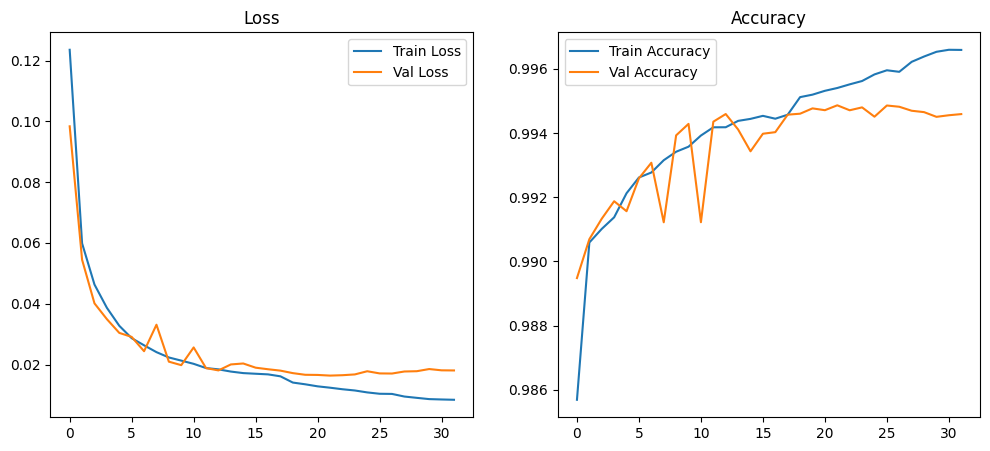

In [43]:
plt.figure(figsize=(12,5))
plt.subplot(1 , 2 , 1)
plt.plot(history.history['loss'] , label = "Train Loss")
plt.plot(history.history["val_loss"] , label = "Val Loss")
plt.title("Loss")
plt.legend()

plt.subplot(1 , 2 , 2)
plt.plot(history.history["accuracy"] , label= "Train Accuracy")
plt.plot(history.history["val_accuracy"] , label = "Val Accuracy")
plt.title("Accuracy")
plt.legend()
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


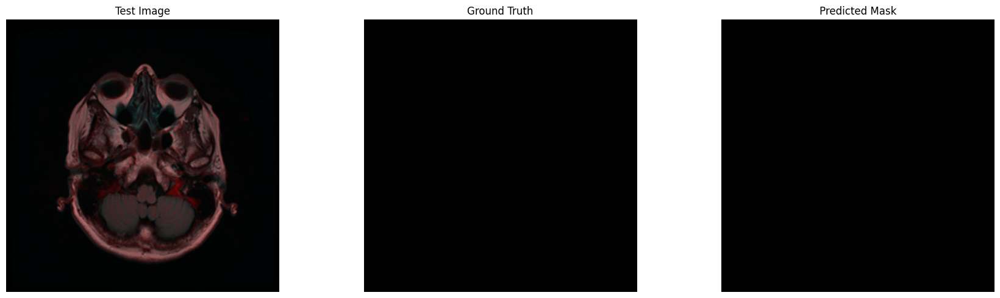

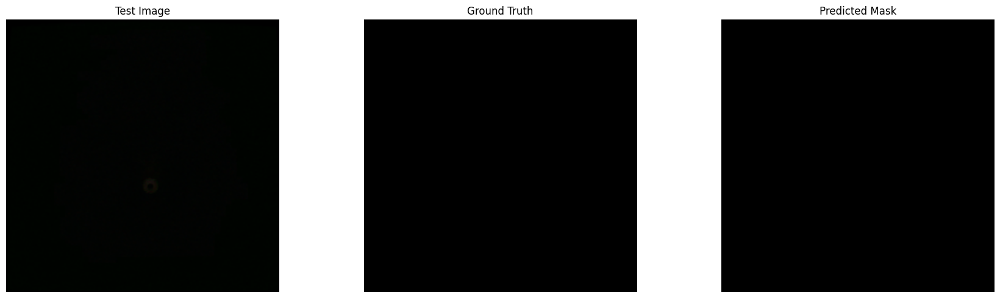

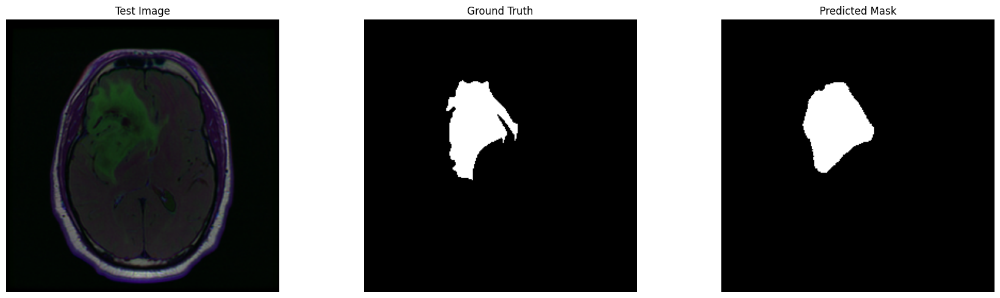

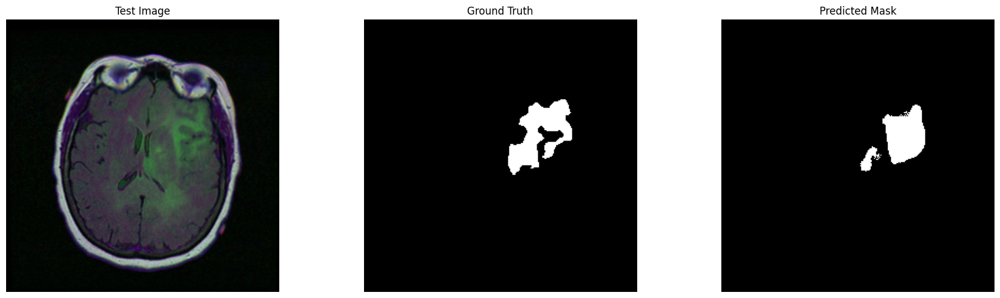

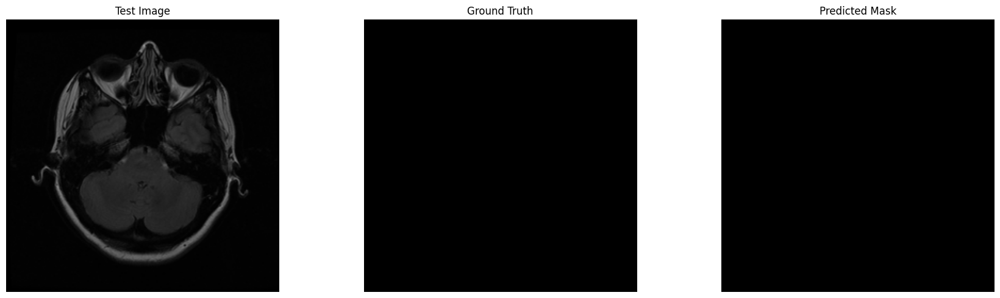

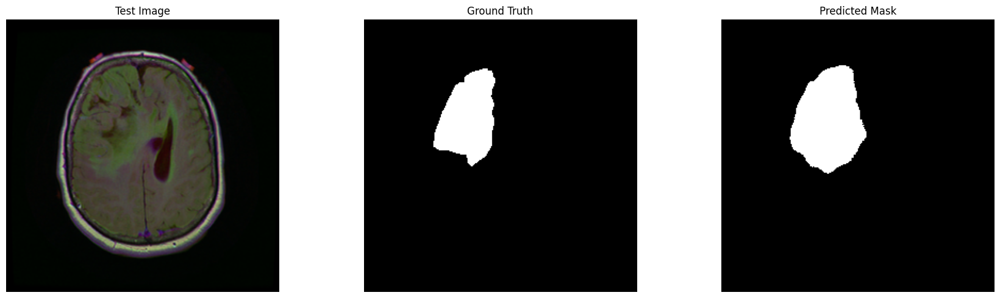

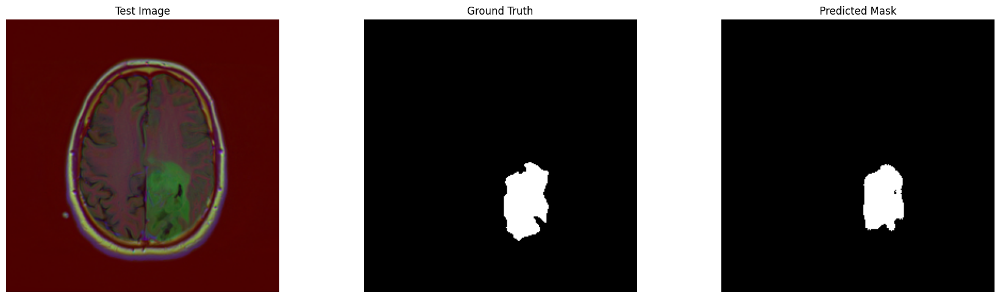

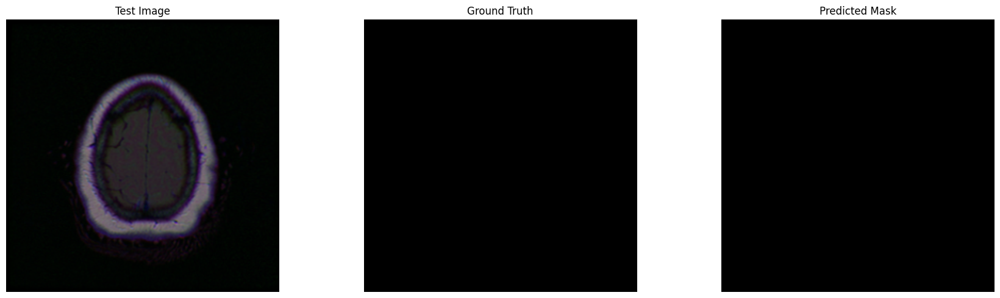

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step


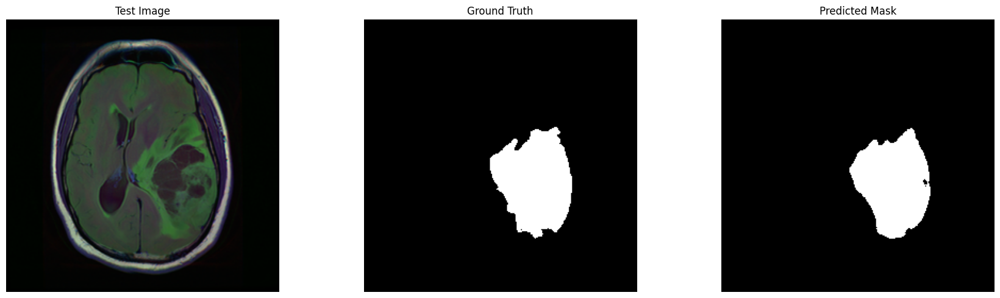

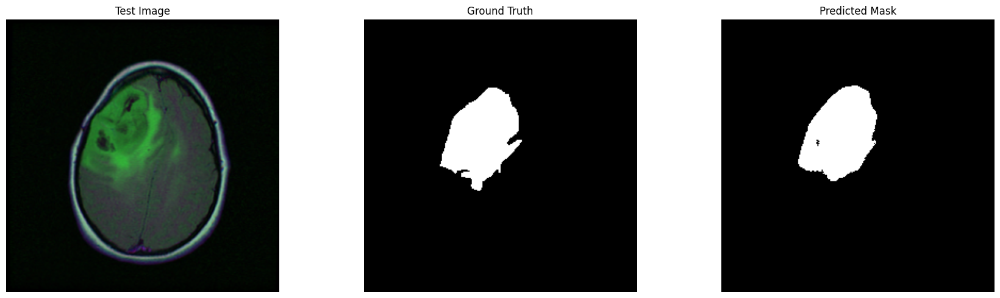

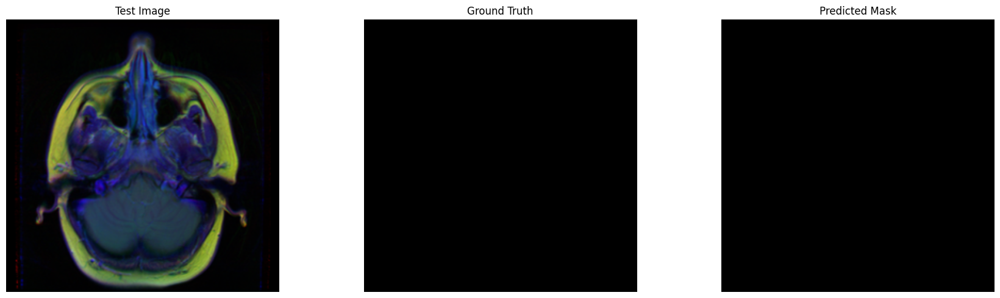

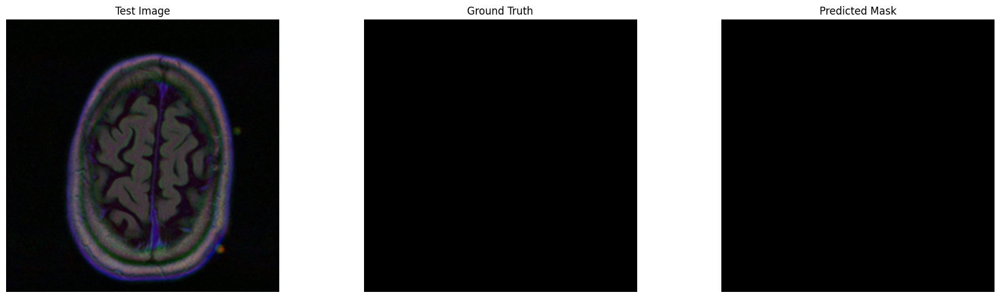

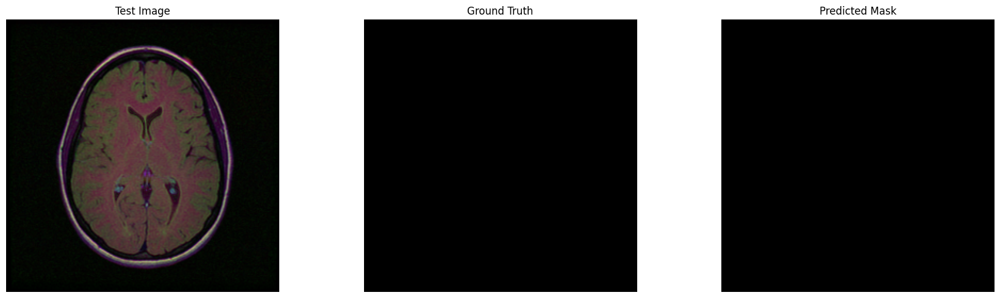

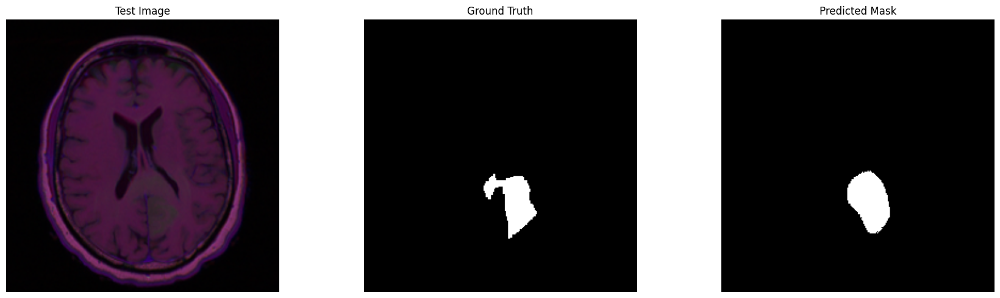

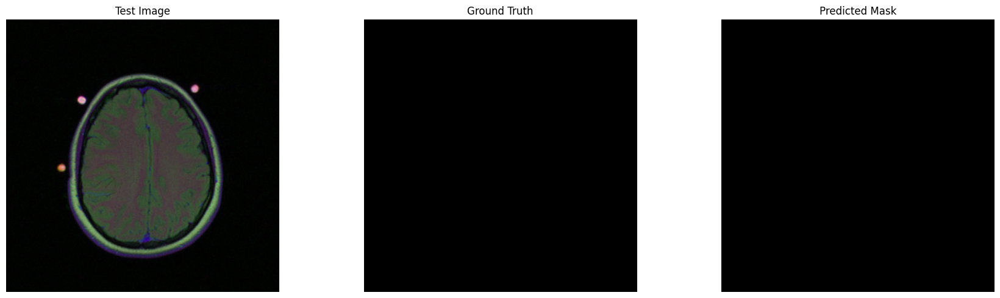

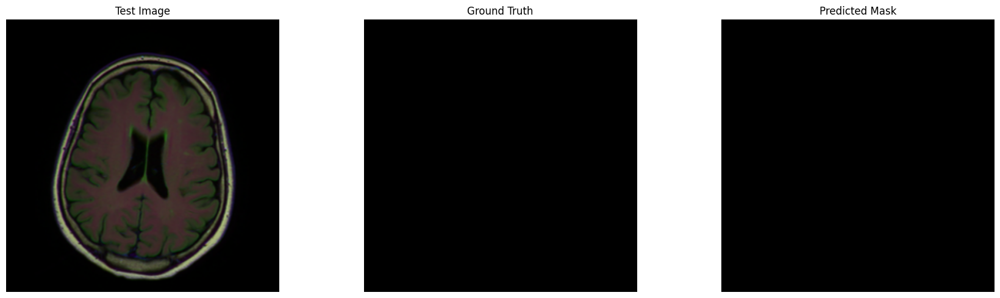

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step


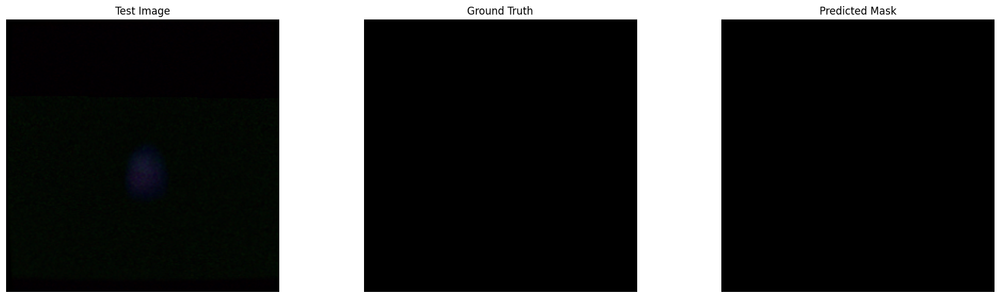

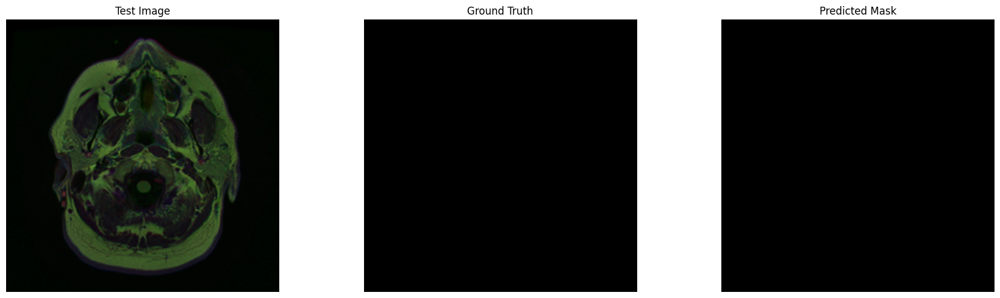

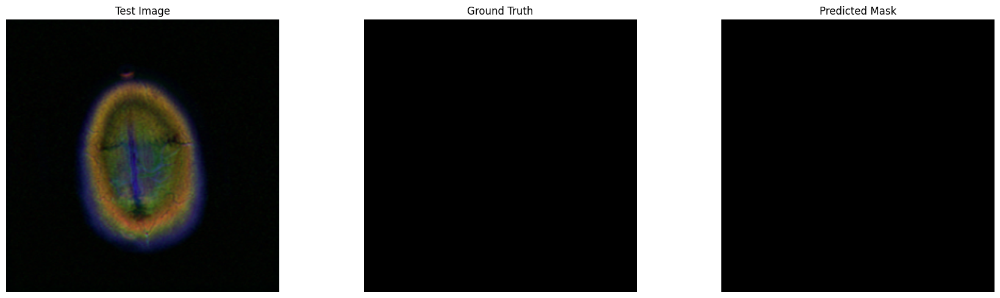

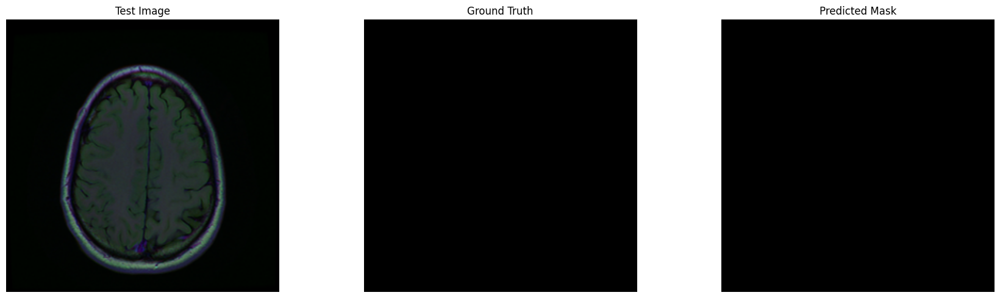

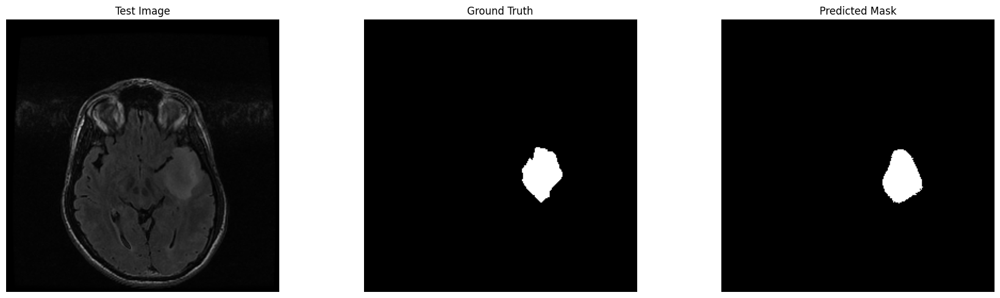

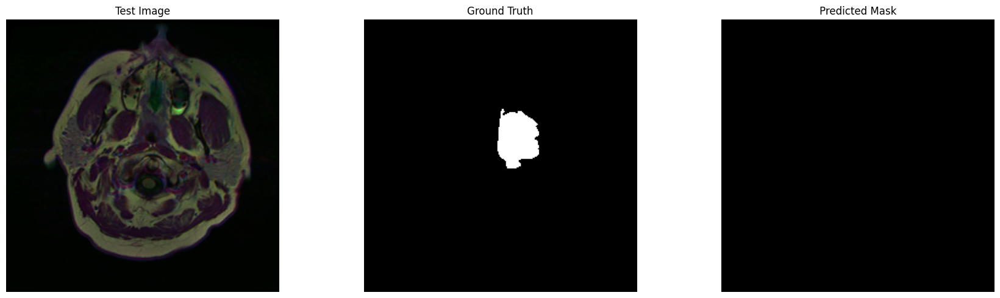

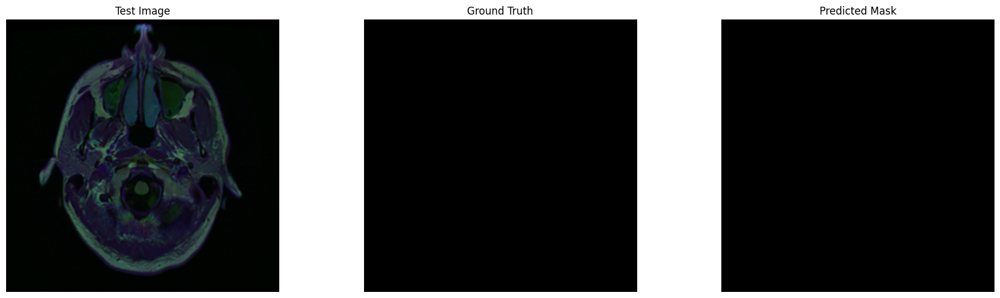

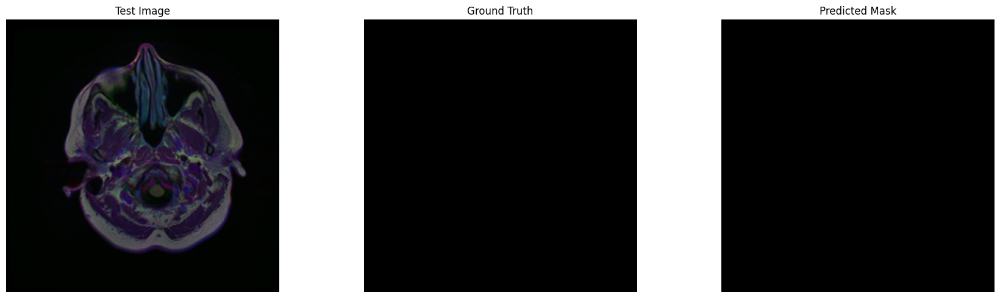

In [45]:
def show_model_predictions(dataset, n=3):
    for i, (image_batch, true_mask_batch) in enumerate(dataset.take(n)):
        pred_mask_batch = model.predict(image_batch)
        for j in range(image_batch.shape[0]):
            image_np = image_batch[j].numpy()
            true_mask_np = true_mask_batch[j].numpy()
            pred_mask_np = pred_mask_batch[j]
            
            fig, axs = plt.subplots(1, 3, figsize=(18, 5))
            axs[0].imshow(image_np)
            axs[0].set_title("Test Image")
            axs[1].imshow(true_mask_np[..., 0], cmap="gray")
            axs[1].set_title("Ground Truth")
            axs[2].imshow(pred_mask_np[..., 0] > 0.5, cmap="gray")
            axs[2].set_title("Predicted Mask")
            for ax in axs:
                ax.axis("off")
            plt.tight_layout()
            plt.show()

show_model_predictions(test_dataset, n=3)

In [46]:
model.evaluate(test_dataset)

74/74 ━━━━━━━━━━━━━━━━━━━━ 10s 140ms/step - accuracy: 0.9949 - loss: 0.0176


[0.01991509087383747, 0.9944220185279846]

In [50]:
from sklearn.metrics import classification_report

# Define segmentation-specific metrics
def dice_coefficient(y_true, y_pred, smooth=1e-6):
    y_true_f = np.ravel(y_true)  
    y_pred_f = np.ravel(y_pred > 0.5)  
    intersection = np.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (np.sum(y_true_f) + np.sum(y_pred_f) + smooth)

def iou(y_true, y_pred, smooth=1e-6):
    y_true_f = np.ravel(y_true) 
    y_pred_f = np.ravel(y_pred > 0.5)
    intersection = np.sum(y_true_f * y_pred_f)
    union = np.sum(y_true_f) + np.sum(y_pred_f) - intersection
    return (intersection + smooth) / (union + smooth)

def evaluate_model(dataset, model, x_test=None):
    dice_scores = []
    iou_scores = []
    all_true = []
    all_pred = []
    image_names = []

    print("Evaluating model on test dataset...")
    for i, (image_batch, true_mask_batch) in enumerate(dataset):
        pred_mask_batch = model.predict(image_batch, verbose=0)
        for j in range(image_batch.shape[0]):
            true_mask = true_mask_batch[j].numpy()
            pred_mask = pred_mask_batch[j]

            dice = dice_coefficient(true_mask, pred_mask)
            iou_score = iou(true_mask, pred_mask)

            dice_scores.append(dice)
            iou_scores.append(iou_score)

            true_mask_flat = np.ravel(true_mask > 0.5).astype(np.int32)
            pred_mask_flat = np.ravel(pred_mask > 0.5).astype(np.int32)
            all_true.extend(true_mask_flat)
            all_pred.extend(pred_mask_flat)

            if x_test is not None:
                image_name = x_test[i * image_batch.shape[0] + j]
                image_names.append(os.path.basename(image_name))
            else:
                image_names.append(f"image_{i * image_batch.shape[0] + j}")

    # Save per-image metrics to CSV
    metrics_df = pd.DataFrame({
        "Image": image_names,
        "Dice": dice_scores,
        "IoU": iou_scores
    })
    metrics_df.to_csv("test_metrics.csv", index=False)
    print("Per-image metrics saved to test_metrics.csv")

    # Compute average segmentation metrics
    avg_dice = np.mean(dice_scores)
    avg_iou = np.mean(iou_scores)
    print(f"Average Dice Coefficient: {avg_dice:.4f}")
    print(f"Average IoU: {avg_iou:.4f}")

    print("\nClassification Report:")
    print(classification_report(all_true, all_pred, target_names=["Background", "Tumor"], digits=4))

evaluate_model(test_dataset, model, x_test=x_test)

print("\nDefault model.evaluate results:")
model.evaluate(test_dataset)

Evaluating model on test dataset...
Per-image metrics saved to test_metrics.csv
Average Dice Coefficient: 0.8089
Average IoU: 0.7775

Classification Report:
              precision    recall  f1-score   support

  Background     0.9963    0.9981    0.9972  38290489
       Tumor     0.7634    0.6172    0.6826    375751

    accuracy                         0.9944  38666240
   macro avg     0.8798    0.8077    0.8399  38666240
weighted avg     0.9940    0.9944    0.9941  38666240


Default model.evaluate results:
74/74 ━━━━━━━━━━━━━━━━━━━━ 10s 136ms/step - accuracy: 0.9949 - loss: 0.0176


[0.01991509087383747, 0.9944220185279846]